In [1]:
from basic_utils import *
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('whitegrid')

from copy import deepcopy as copy
import cooler

DEBUG:matplotlib:CACHEDIR=/home/agalicina/.cache/matplotlib
DEBUG:matplotlib.font_manager:Using fontManager instance from /home/agalicina/.cache/matplotlib/fontList.json
DEBUG:matplotlib.backends:backend module://ipykernel.pylab.backend_inline version unknown
DEBUG:matplotlib.backends:backend module://ipykernel.pylab.backend_inline version unknown
DEBUG:matplotlib.backends:backend module://ipykernel.pylab.backend_inline version unknown


In [2]:
experiment_ids = "A9 B15 B19 B26 B3 B31 sc19 sc29 A2 A3 A5 A6 A8 B16 B6 sc1 sc16 sc21 sc23 sc24".split()
chrms = ['chr2L', 'chr3L', 'chr2R', 'chr3R', 'chrX']

labels_ordered = 'population merged A6 B31 A8 A5 sc23 B26 B19 B16 sc16 B3 A2 A3 sc1 B6 A9 sc24 sc29 sc19 sc21 B15'.split()

resolution = 10

### Reading tracks

Let's create dataframe with all tracks

In [3]:
categories = ['stable', 'nearly_stable', 'nearly_nonstable', 'nonstable', 'population', 'merged', 'randomized']
keys_mod = ['A6', 'B31', 'A8', 'A5', 'sc23', 'B26', 'B19', 'B16', 'sc16', 'B3', 'A2', 'A3', 'sc1', 'B6', 'A9', 'sc24', 'sc29', 'sc19', 'sc21', 'B15']

In [4]:
WD_TRACKS = "../DATA/ANNOT/ML-DmBG3_10K/"
annot = open("../DATA/ANNOT/ML-DmBG3.names", 'r').readlines()
annot = dict([[y.strip() for y in x.split(' - ')] for x in annot])
annot1 = {x: annot[x].split('/')[-1].split(':')[0] for x in annot.keys()}
annot1.update({'rnaseq1': 'BG3 RNA-Seq', 
               'rnaseq2': 'BG3 RNA-Seq', 
              'housekeeping': 'housekeeping',
              'tissue-spec-BG3exp': 'tissue-spec-BG3exp',
              'tissue-spec-BG3noexp': 'tissue-spec-BG3noexp',
              'tss': 'tss',
               'tes':'tes',
              'all_genes': 'all_genes',
              'mappability_pop': 'mappability_pop',
              'mappability_merged': 'mappability_merged',
              'is120': 'is120',
              'is100': 'is100',
              'is80': 'is80'
              })

import glob
fs = glob.glob(WD_TRACKS+"*.binned")
f_dict = {x.split("-")[-1].split('.')[0]:x for x in fs if 'merged' not in x}
f_dict.update({'rnaseq1': '../DATA/ANNOT/ML-DmBG3-RNAseq/BG3-110K.binned', 
               'rnaseq2': '../DATA/ANNOT/ML-DmBG3-RNAseq/BG3-210K.binned',
              'housekeeping': '../DATA/ANNOT/GENES/housekeeping_10K.cov.bedgraph',
              'tissue-spec-BG3exp': '../DATA/ANNOT/GENES/tissuespecBG3exp_10K.cov.bedgraph',
              'tissue-spec-BG3noexp': '../DATA/ANNOT/GENES/tissuespecBG3noexp_10K.cov.bedgraph',
              'tss': '../DATA/ANNOT/GENES/allgenestss_10K.cov.bedgraph',
              'tes': '../DATA/ANNOT/GENES/allgenestes_10K.cov.bedgraph',
              'all_genes': '../DATA/ANNOT/GENES/allgenes_10K.cov.bedgraph',
              'mappability_pop': '../DATA/ANNOT/Dros_mappability_10kb_raw.bed',
              'mappability_merged': '../DATA/ANNOT/merged_mappability_10kb_raw.bed',
              'is100':'../DATA/ANNOT/Dros_IS_balanced_10_100kb.bed',
              'is120':'../DATA/ANNOT/Dros_IS_balanced_10_120kb.bed',
              'is80':'../DATA/ANNOT/Dros_IS_balanced_10_80kb.bed'
              })

# for x in categories:
#     f_dict.update({'boundary_{}'.format(x): '../DATA/ANNOT/complex_boundaries_{}.cov.bed'.format(x)})
#     annot1.update({'boundary_{}'.format(x): 'boundary_{}'.format(x)})

# f_dict.update({'subsampling_support': '../DATA_SUBSAMPLE/borders_subsample_stability.bedgraph'})
# annot1.update({'subsampling_support': 'subsampling_support'})

import operator
ks = [x[0] for x in sorted(annot1.items(), key=operator.itemgetter(1))]


## All selected for genome research
selected_tracks = ['rnaseq1', 'rnaseq2', 'housekeeping', 'tissue-spec-BG3exp', 'tissue-spec-BG3noexp',
                   'tss', 'tes', 'all_genes', 'mappability_pop', 'mappability_merged', 'is80', 'is120', 'is100',
                   '105', '112', '113', '114', '129', '132', '155', '171', '174',
                   '192', '21', '217', '220', '225', '228', '232', '235', '238',
                   '241', '244', '247', '250', '253', '268', '290', '293', '296',
                   '299', '30', '39', '48', '51', '54', '57', '63', '83', '86', '92']
# for x in categories:
#     selected_tracks.append('boundary_{}'.format(x))
# selected_tracks.append('subsampling_support')

In [5]:
df = pd.DataFrame()
for l in selected_tracks:
    infile = f_dict[l]
    df_tmp = pd.read_csv(infile, sep='\s*')
    name = "{}_{}".format(l, annot1[l]) if l!=annot1[l] else l
    if len(df_tmp.columns) == 3:
        df_tmp.columns = ['ch', 'pos', name]
    else:
        df_tmp.columns = ['ch', 'pos', 'end', name]
        df_tmp = df_tmp.drop('end', axis=1)
        
    if len(df)==0:
        df = df_tmp.copy()
    else:
        df = pd.merge(df, df_tmp, on=['ch', 'pos'])

/home/agalicina/anaconda3/envs/distiller-editable/lib/python3.6/site-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


# Reading readymade borders annotation

In [6]:
df1 = pd.read_csv('../DATA_SUBSAMPLE/TMP/subsample_borders_merged_offset0.csv', 
                  low_memory=False, 
                  header=[0,1,2,3], index_col=[0,1])

In [8]:
# Allowing offset = 0
df = (df1==1).copy()

# Alternative for offset = 1
# mtx = df.values # Extracting dataframe as matrix for fast numpy computation
# for i_col in range(len(df.columns)):
#     v = np.where(df.iloc[:, i_col] == 1)[0][1:-1]
#     mtx[np.concatenate([v-1, v+1]), i_col] = 1
# df.loc[:,:] = mtx

## df_final

In [9]:
oi = [str(x) for x in np.arange(10)]
df_tmp = df.loc(axis=1)[:,:,oi,:]
support = df_tmp.sum(axis=1)/df_tmp.count(axis=1)

df_tmp = df.loc(axis=1)[:,:,oi,:].T.reset_index().groupby('cell')
support_bycell = (df_tmp.sum()/df_tmp.count()).T

df_tmp = df.loc(axis=1)[:,:,oi,:].T.reset_index().groupby(['cell', 'perc'])
support_bycell_byprc = (df_tmp.sum()/df_tmp.count()).T

presence_bycell = df.loc[:, labels_ordered[2:]].T.reset_index().drop(['colname', 'niter', 'perc'], axis=1).set_index('cell').T

/home/agalicina/anaconda3/envs/distiller-editable/lib/python3.6/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


#### Looking for decision boundary

In [ ]:
from sklearn import metrics

In [10]:
# Naive decision boundary
oi = [str(x) for x in np.arange(10)]
df_tmp = df.loc(axis=1)[:,:,oi,:].T.reset_index().groupby(['cell', 'perc'])
support_bycell_byprc = (df_tmp.sum()/df_tmp.count()).T

df_final = pd.DataFrame()

for exp in experiment_ids:
    df_exp = df.loc(axis=1)[:, exp, :, :].T
    golden_standard = df_exp.loc(axis=0)[:, exp, :, '100'].values[0]
    
    support_bycell_byprc.loc(axis=1)[exp, :].loc[golden_standard]
    
    df_tmp = pd.DataFrame(support_bycell_byprc.loc(axis=1)[exp, :].loc[golden_standard].unstack().unstack().dropna())
    df_tmp.loc[:,'standard'] = True
    
    df_tmp1 = pd.DataFrame(support_bycell_byprc.loc(axis=1)[exp, :].loc[np.logical_not(golden_standard)].unstack().unstack().dropna())
    df_tmp1.loc[:,'standard'] = False
    
    df_final = pd.concat([df_final, df_tmp, df_tmp1])
    
df_final = df_final.reset_index()
df_final.columns = ['cell', 'perc', 'bgn', 'ch', 'support', 'standard']
df_final.loc[:,"perc"] = df_final.loc[:,"perc"].astype(int)

/home/agalicina/anaconda3/envs/distiller-editable/lib/python3.6/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [11]:
oi = np.arange(5, 100, 5)

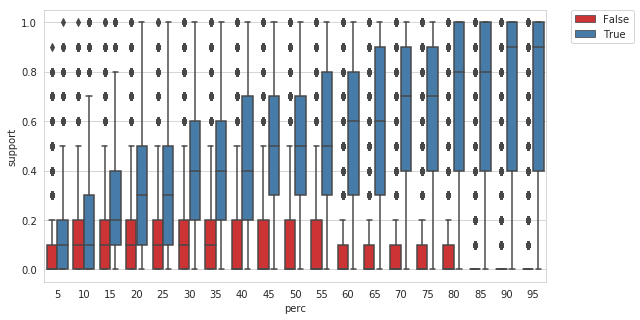

In [158]:
plt.figure(figsize=[9,5])
sns.boxplot(x="perc", y="support", hue="standard", data=df_final, palette="Set1", order=oi)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [34]:
g = df_final.groupby('perc')
df_tmp = g.get_group(5).drop('perc', axis=1)
df_tmp.columns = ['cell', 'bgn', 'ch', 5, 'standard']
for i in oi[1:]:
    a = g.get_group(i).drop('perc', axis=1)
    a.columns = ['cell', 'bgn', 'ch', i, 'standard']
    df_tmp = pd.merge(df_tmp, a, on=['cell', 'ch', 'bgn', 'standard'], how='outer')
    
X, y = df_tmp[oi], df_tmp['standard']

thresholds = np.arange(0,1.1,0.01)
fdrs = {}
for prc in np.arange(5,100,5):
    fdrs[prc] = []
    for th in thresholds:
        tn, fp, fn, tp = metrics.confusion_matrix(X[prc]>th, y).ravel()
        fdr = fp/(tp+fp)
        fdrs[prc].append(fdr)
        
print(np.min(pd.DataFrame(fdrs).values))

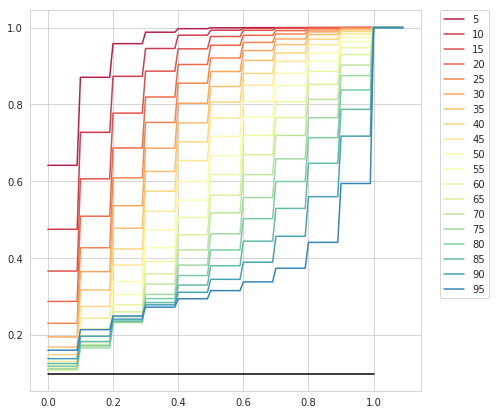

In [82]:
sns.set_palette('Spectral', 20)

plt.figure(figsize=[7, 7])
for prc in np.arange(5, 100, 5):
    fdr = fdrs[prc]
    plt.plot(thresholds, fdr, label=prc)


plt.plot([0.0,1.0], [0.1, 0.1], color='black')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


In [ ]:
plt.figure(figsize=[7,7])
for i in oi:
    df_tmp = df_final.query('perc=={}'.format(i))
    fpr, tpr, thresholds = metrics.roc_curve(df_tmp['standard'].astype(int), df_tmp['support'])    
    score = metrics.roc_auc_score(df_tmp['standard'].astype(int), df_tmp['support'])
    plt.plot(fpr, tpr, label="{}, {:.4f}".format(i, score))
    
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

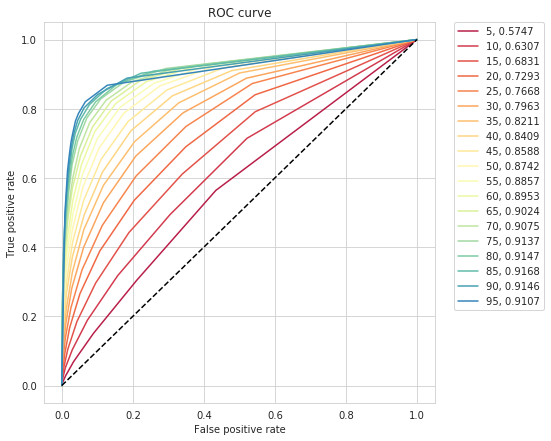

In [159]:
from sklearn import metrics

plt.figure(figsize=[7,7])
for i in oi:
    df_tmp = df_final.query('perc=={}'.format(i))
    fpr, tpr, thresholds = metrics.roc_curve(df_tmp['standard'].astype(int), df_tmp['support'])    
    score = metrics.roc_auc_score(df_tmp['standard'].astype(int), df_tmp['support'])
    plt.plot(fpr, tpr, label="{}, {:.4f}".format(i, score))
    
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

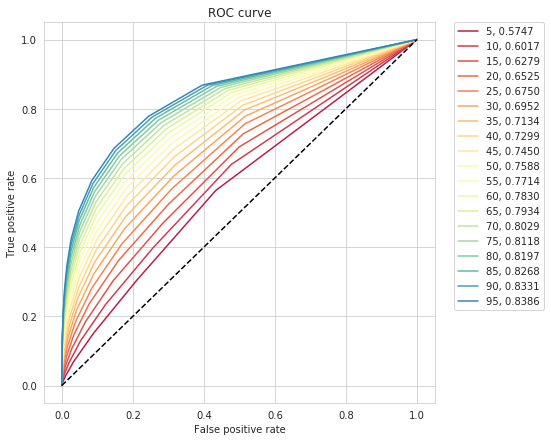

In [160]:
# Decision from bottom
plt.figure(figsize=[7,7])
for i in np.arange(5, 100, 5):
    df_tmp = df_final.query('perc<={}'.format(i))
    fpr, tpr, thresholds = metrics.roc_curve(df_tmp['standard'].astype(int), df_tmp['support']) 
    score = metrics.roc_auc_score(df_tmp['standard'].astype(int), df_tmp['support'])
    plt.plot(fpr, tpr, label="{}, {:.4f}".format(i, score))
    
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

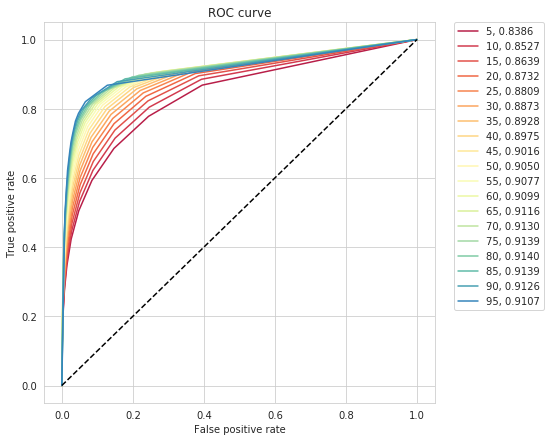

In [157]:
# Decision from top
plt.figure(figsize=[7,7])
for i in np.arange(5, 100, 5):
    df_tmp = df_final.query('perc>={}'.format(i))
    fpr, tpr, thresholds = metrics.roc_curve(df_tmp['standard'].astype(int), df_tmp['support'])    
    score = metrics.roc_auc_score(df_tmp['standard'].astype(int), df_tmp['support'])
    plt.plot(fpr, tpr, label="{}, {:.4f}".format(i, score))
    
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

### Cumulative

In [91]:
oi = [str(x) for x in np.arange(10)]

In [92]:
df_tmp = df.loc(axis=1)[:,:,oi,:].T.reset_index()
df_tmp.loc[:,'perc'] = df_tmp.loc[:,'perc'].astype(int)

df_tmp2 = pd.DataFrame()
for i in np.arange(5, 100, 5):
    df_tmp1 = df_tmp[df_tmp.loc[:,'perc']>=i].copy()
    df_tmp1.loc[:,'cum'] = i
    df_tmp2 = pd.concat([df_tmp2, df_tmp1])

df_tmp2 = df_tmp2.groupby(['cell', 'cum'])
support_bycell_byprc_cum = (df_tmp2.sum()/df_tmp2.count()).T

/home/agalicina/anaconda3/envs/distiller-editable/lib/python3.6/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [93]:
df_final = pd.DataFrame()

for exp in experiment_ids:
    df_exp = df.loc(axis=1)[:, exp, :, :].T
    golden_standard = df_exp.loc(axis=0)[:, exp, :, '100'].values[0]
    
    support_bycell_byprc_cum.loc(axis=1)[exp, :].loc[golden_standard]
    
    df_tmp = pd.DataFrame(support_bycell_byprc_cum.loc(axis=1)[exp, :].loc[golden_standard].unstack().unstack().dropna())
    df_tmp.loc[:,'standard'] = True
    
    df_tmp1 = pd.DataFrame(support_bycell_byprc_cum.loc(axis=1)[exp, :].loc[np.logical_not(golden_standard)].unstack().unstack().dropna())
    df_tmp1.loc[:,'standard'] = False
    
    df_final = pd.concat([df_final, df_tmp, df_tmp1])
    
df_final = df_final.reset_index()
df_final.columns = ['cell', 'cum', 'bgn', 'ch', 'support', 'standard']

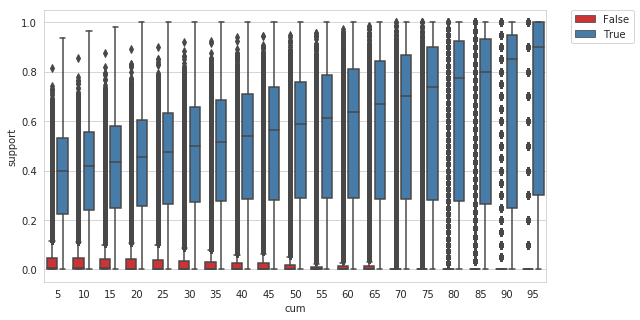

In [94]:
oi = np.arange(5, 100, 5)

plt.figure(figsize=[9,5])
sns.boxplot(x="cum", y="support", hue="standard", data=df_final, palette="Set1", order=oi)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [97]:
g = df_final.groupby('cum')
df_tmp = g.get_group(5).drop('cum', axis=1)
df_tmp.columns = ['cell', 'bgn', 'ch', 5, 'standard']
for i in oi[1:]:
    a = g.get_group(i).drop('cum', axis=1)
    a.columns = ['cell', 'bgn', 'ch', i, 'standard']
    df_tmp = pd.merge(df_tmp, a, on=['cell', 'ch', 'bgn', 'standard'], how='outer')
    
X, y = df_tmp[oi], df_tmp['standard']

thresholds = np.arange(0,1.1,0.01)
fdrs = {}
for prc in np.arange(5,100,5):
    fdrs[prc] = []
    for th in thresholds:
        tn, fp, fn, tp = metrics.confusion_matrix(X[prc]>th, y).ravel()
        fdr = fp/(tp+fp)
        fdrs[prc].append(fdr)

0.05872507122507122


In [106]:
df_fdrs = pd.DataFrame(fdrs)

In [134]:
np.sum(y==True), np.sum(y==False), np.sum(y==True)/len(y), np.sum(y==False)/len(y)

(28080, 209880, 0.11800302571860817, 0.8819969742813918)

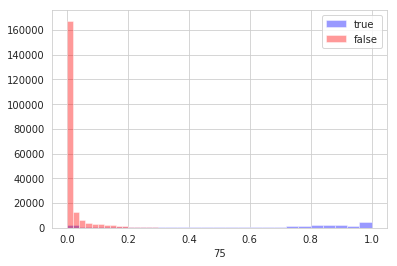

In [131]:
sns.distplot(X[75][y==True],  label='true', color='blue', kde=False)
sns.distplot(X[75][y==False], label='false', color='red', kde=False)
plt.legend()

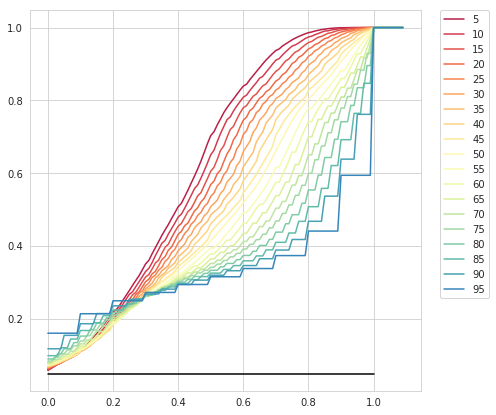

In [100]:
sns.set_palette('Spectral', 20)

plt.figure(figsize=[7, 7])
for prc in np.arange(5, 100, 5):
    fdr = fdrs[prc]
    plt.plot(thresholds, fdr, label=prc)


plt.plot([0.0,1.0], [0.05, 0.05], color='black')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


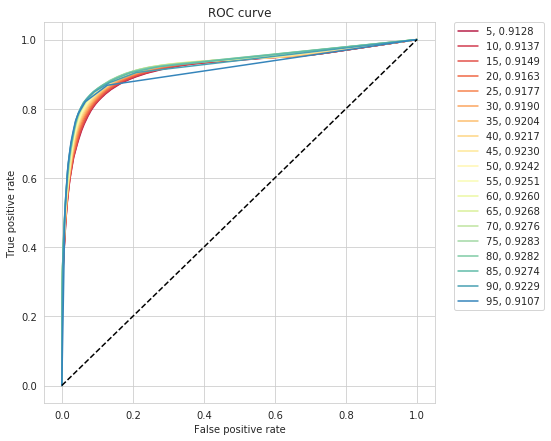

In [185]:
from sklearn import metrics

plt.figure(figsize=[7,7])
for i in oi:
    df_tmp = df_final.query('cum=={}'.format(i))
    fpr, tpr, thresholds = metrics.roc_curve(df_tmp['standard'].astype(int), df_tmp['support'])    
    score = metrics.roc_auc_score(df_tmp['standard'].astype(int), df_tmp['support'])
    plt.plot(fpr, tpr, label="{}, {:.4f}".format(i, score))
    
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Вывод - разделяем по 75%! AUROC выше всех предыдущих тестов

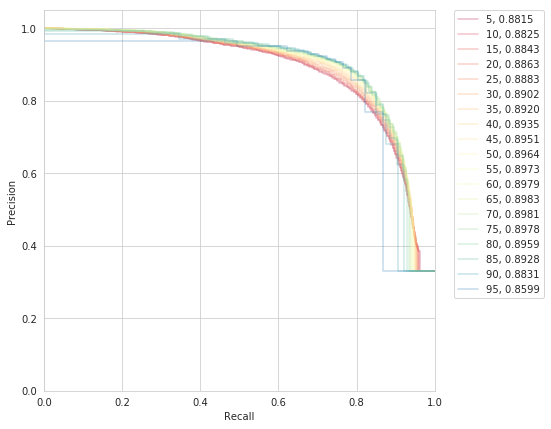

In [204]:
# PR
from sklearn.utils.fixes import signature
from sklearn.metrics import average_precision_score

plt.figure(figsize=[7,7])
for i in oi:
    df_tmp = df_final.query('cum=={}'.format(i))

    precision, recall, _ = metrics.precision_recall_curve(df_tmp['standard'].astype(int), df_tmp['support'])
    average_precision = average_precision_score(df_tmp['standard'].astype(int), df_tmp['support'])

    plt.step(recall, precision, alpha=0.3, where='post', 
             label="{}, {:.4f}".format(i, average_precision))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [422]:
df_tmp = df_final.query('cum=={}'.format(75))
fpr, tpr, thresholds = metrics.roc_curve(df_tmp['standard'].astype(int), df_tmp['support'])  
precision, recall, thresholds1 = metrics.precision_recall_curve(df_tmp['standard'].astype(int), df_tmp['support'])

In [423]:
acc = [metrics.accuracy_score(df_tmp['standard'].astype(int), df_tmp['support']>th) for th in thresholds]

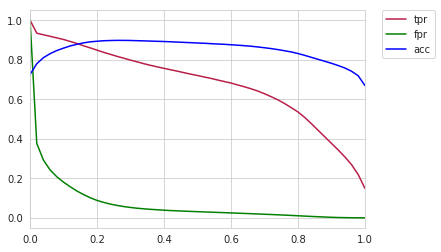

In [424]:
plt.plot(thresholds, tpr, label='tpr')
plt.plot(thresholds, fpr, label='fpr', color='green')
plt.plot(thresholds, acc, label='acc', color='blue')

plt.xlim(0,1)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [425]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_idx, optimal_threshold, fpr[optimal_idx], tpr[optimal_idx]

(41, 0.2, 0.08848341915938557, 0.8487692444829299)

In [426]:
optimal_idx = np.argmax(acc)
optimal_threshold = thresholds[optimal_idx]
optimal_idx, optimal_threshold, acc[optimal_idx]

(38, 0.26, 0.8981551521264078)

In [ ]:
# Compare accuracies: 
for i in np.arange(5, 100, 5):
    df_tmp = df_final.query('cum=={}'.format(75))


Resulting selection criteria:

    not a boundary if cumulative support is smaller that 26% at {75%..95%} subsampling level
    
This will give accuracy of 0.891

In [ ]:
(df1==1).loc(axis=1)[:,:,:,'100'].sum(axis=1)

In [251]:
oi = [str(x) for x in np.arange(10)] # selection of subsamples (have positive niter)

df_tmp = df.loc(axis=1)[:,:,oi,['75', '80', '85', '90', '95']].T.reset_index().groupby('cell')
support_bycell_final = (df_tmp.sum()/df_tmp.count()).drop(['colname', 'niter', 'perc'], axis=1).T
selection_final = support_bycell_final>0.26

noisy_boundaries = (df1==1).loc(axis=1)[:,experiment_ids,:,'100'].T.reset_index().drop(['colname', 'niter', 'perc'], axis=1).set_index('cell').T
refined_boundaries = selection_final&noisy_boundaries

/home/agalicina/anaconda3/envs/distiller-editable/lib/python3.6/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [252]:
np.sum(noisy_boundaries.sum(axis=1)>0)

9961

In [253]:
np.sum(noisy_boundaries.sum(axis=1)>0) - np.sum(refined_boundaries.sum(axis=1)>0), len(refined_boundaries)

(1078, 11898)

In [254]:
np.sum(refined_boundaries.sum(axis=1)>0)

8883

In [255]:
np.sum(refined_boundaries.sum(axis=1)>0), np.sum(noisy_boundaries.sum(axis=1)>0), np.sum(selection_final.sum(axis=1)>0)

(8883, 9961, 9435)

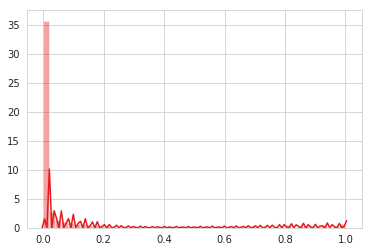

In [256]:
sns.distplot(support_bycell_final.values.flatten())

In [ ]:
sns.distplot(selection_final.sum(axis=1)/20, label='Supported bins', color='blue')
sns.distplot(noisy_boundaries.sum(axis=1)/20, label='Noisy boundaries', color='red')
sns.distplot(refined_boundaries.sum(axis=1)/20, label="Refined boundaries", color='green')
plt.legend()
plt.title("Percentage of cells with boundary")

In [ ]:
np.sum(refined_boundaries.sum(axis=1)>0), np.sum(noisy_boundaries.sum(axis=1)>0), np.sum(selection_final.sum(axis=1)>0)

In [ ]:
np.sum(refined_boundaries.sum(axis=1)==0)

In [ ]:
np.sum(refined_boundaries.sum(axis=1)>0)/len(refined_boundaries), \
np.sum(noisy_boundaries.sum(axis=1)>0)/len(refined_boundaries)

In [ ]:
np.sum(refined_boundaries.sum(axis=1)==0)/len(refined_boundaries), \
np.sum(noisy_boundaries.sum(axis=1)==0)/len(refined_boundaries)

### Calculate boundaries presence in refined dataframe

In [244]:
boundaries_set = refined_boundaries.sum(axis=1)>0

In [245]:
np.sum(boundaries_set)/len(refined_boundaries)

0.7465960665658093

In [246]:
rb_off = refined_boundaries.copy()
mtx = rb_off.values # Extracting dataframe as matrix for fast numpy computation
for i_col in range(len(rb_off.columns)):
    v = np.where(rb_off.iloc[:, i_col] == 1)[0][1:-1]
    mtx[np.concatenate([v-1, v+1]), i_col] = 1
rb_off.loc[:,:] = mtx

In [247]:
bs_support = boundaries_set.copy()
bs_support[boundaries_set>0] = rb_off.sum(axis=1)[boundaries_set>0]

In [248]:
len(bs_support)

11898

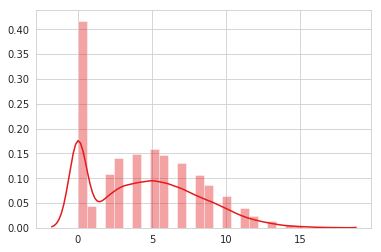

In [249]:
sns.distplot( bs_support )

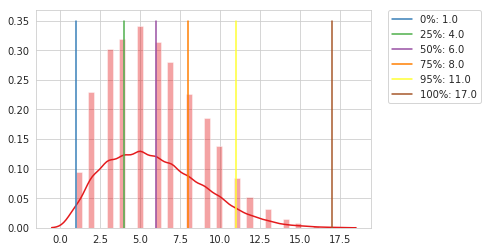

In [250]:
sns.set_palette('Set1')
v = bs_support[bs_support>0]
sns.distplot( v )
for perc in [0, 25, 50, 75, 95, 100]:
    th = np.percentile(v, perc)
    plt.plot([th,th], [0,0.35], label="{}%: {}".format(perc, th))
    
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

#### Comparison with populaion

In [269]:
refined_boundaries

cell               A2     A3     A5     A6     A8     A9    B15    B16    B19  \
ch    bgn                                                                       
chr2L 0          True  False  False  False  False  False  False  False  False   
      10000     False  False  False  False  False  False  False  False   True   
      20000     False  False  False  False   True  False  False  False  False   
      30000     False  False  False  False  False  False  False  False  False   
      40000     False  False  False  False  False  False  False  False  False   
      50000     False  False   True  False  False  False  False  False  False   
      60000     False  False  False  False  False  False  False  False   True   
      70000     False  False  False   True   True  False  False  False  False   
      80000      True  False  False  False  False  False  False  False  False   
      90000     False  False  False  False  False  False  False  False   True   
      100000    False   True  False  False  False  False   True  False  False   
      110000    False  False  False  False  False  False  False  False  False   
      120000     True  False  False  False  False  False  False  False  False   
      130000    False  False  False  False  False  False  False  False  False   
      140000    False  False  False  False  False  False  False  False  False   
      150000    False  False   True  False   True  False  False  False  False   
      160000    False   True  False  False   True  False  False  False  False   
      170000     True  False  False  False  False   True  False  False  False   
      180000     True  False  False  False  False  False  False  False  False   
      190000    False  False  False  False  False  False  False  False  False   
      200000    False  False  False  False  False  False  False  False  False   
      210000    False  False  False  False  False  False  False  False  False   
      220000    False  False  False  False  False   True  False  False  False   
      230000    False  False  False  False  False  False  False  False  False   
      240000    False  False  False  False  False  False  False  False  False   
      250000     True  False  False   True  False  False  False   True   True   
      260000    False  False  False  False  False  False  False   True  False   
      270000    False  False  False  False  False  False  False  False  False   
      280000     True  False  False  False   True  False  False  False  False   
      290000    False  False   True  False  False  False  False  False  False   
...               ...    ...    ...    ...    ...    ...    ...    ...    ...   
chrX  22140000  False  False  False  False  False  False  False  False   True   
      22150000  False   True  False  False  False  False  False  False  False   
      22160000  False  False  False  False  False  False  False  False  False   
      22170000   True  False  False  False  False  False  False  False  False   
      22180000  False  False  False  False  False  False  False  False  False   
      22190000  False  False  False  False  False  False  False  False  False   
      22200000  False  False  False   True  False  False  False  False  False   
      22210000  False  False  False  False  False  False  False   True  False   
      22220000  False  False  False  False  False  False  False  False   True   
      22230000   True  False  False  False   True  False  False  False  False   
      22240000  False  False   True  False   True  False  False  False  False   
      22250000  False  False  False  False  False  False  False  False  False   
      22260000   True  False  False  False  False  False  False  False  False   
      22270000  False  False  False   True  False  False  False  False  False   
      22280000  False  False  False  False  False  False  False  False   True   
      22290000  False  False  False  False   True  False  False  False  False   
      22300000  False   True  F

In [280]:
population_boundaries = df.loc(axis=1)['population',:,:,'100']
population_boundaries.columns = ['pop']

In [301]:
x = (refined_boundaries.sum(axis=1)>0).values
y = population_boundaries.T.values[0]

np.sum(x&y), np.sum(x), np.sum(y), len(x), np.sum(x|y)

(1323, 8883, 1456, 11898, 9016)

In [300]:
x = (noisy_boundaries.sum(axis=1)>0).values
y = population_boundaries.T.values[0]

np.sum(x&y), np.sum(x), np.sum(y), len(x), np.sum(x|y)

(1385, 9961, 1456, 11898, 10032)

In [360]:
def compare_boundaries(ref, q): # offset=1
    true_set = ref>0
    mod_q = np.concatenate([[0],q[:-1]])|(q>0)|np.concatenate([q[1:],[0]])
    return np.sum(true_set&mod_q)#/np.sum(true_set)

In [350]:
y = noisy_boundaries['A6']
x = refined_boundaries['A6']
compare_boundaries(y, x)

0.7726130653266332

In [433]:
y = noisy_boundaries['A8']
x = noisy_boundaries['A6']
compare_boundaries(y, x)/np.sum(y)

0.5326757090012331

In [432]:
y = refined_boundaries['A8']
x = refined_boundaries['A6']
compare_boundaries(y, x)/np.sum(y)

0.4516653127538586

In [351]:
np.sum(population_boundaries)

pop    1456
dtype: int64

In [423]:
def simulate_v(v):
    ret = np.zeros(len(v), dtype=bool)
    ret[np.random.choice(np.arange(len(v)), np.sum(v), replace=False)] = True
    return ret

In [427]:
y = population_boundaries.T.values[0]

noisy_universal_cell = noisy_boundaries.sum(axis=1).values>0
refined_universal_cell = refined_boundaries.sum(axis=1).values>0

df_tmp = pd.concat( [noisy_boundaries.apply(lambda x: np.sum(x>0), axis=0),
            refined_boundaries.apply(lambda x: np.sum(x>0), axis=0),
            noisy_boundaries.apply(lambda x: compare_boundaries(y, x), axis=0),
            refined_boundaries.apply(lambda x: compare_boundaries(y, x), axis=0)
           ], axis=1 )
df_tmp.columns = ['noisy b', 'refined b', 'noisy_overlap', 'refined_overlap']

df_tmp.loc['universal', :] = [np.sum(noisy_universal_cell), 
                             np.sum(refined_universal_cell),
                             compare_boundaries(y, noisy_universal_cell),
                             compare_boundaries(y, refined_universal_cell)]

df_tmp.loc[:, 'count_loss'] = df_tmp['noisy b'] - df_tmp['refined b']
df_tmp.loc[:, 'overlap_loss'] = df_tmp['noisy_overlap'] - df_tmp['refined_overlap']

#df_tmp.loc[:,'loss_prc'] = 100*df_tmp['overlap_loss'] / df_tmp['count_loss']
df_tmp = pd.concat( [df_tmp, 100*df_tmp[['noisy_overlap', 'refined_overlap']]/1456], axis=1 )


In [428]:
df_tmp

,noisy b,refined b,noisy_overlap,refined_overlap,count_loss,overlap_loss,noisy_overlap,refined_overlap
cell,,,,,,,,
A2,1500.0,1065.0,650.0,502.0,435.0,148.0,44.642857,34.478022
A3,1549.0,1156.0,668.0,535.0,393.0,133.0,45.879121,36.744505
A5,1646.0,1225.0,806.0,641.0,421.0,165.0,55.357143,44.024725
A6,1592.0,1186.0,901.0,731.0,406.0,170.0,61.881868,50.206044
A8,1622.0,1231.0,839.0,672.0,391.0,167.0,57.623626,46.153846
A9,1287.0,1032.0,523.0,442.0,255.0,81.0,35.920330,30.357143
B15,967.0,819.0,367.0,322.0,148.0,45.0,25.206044,22.115385
B16,1517.0,1061.0,692.0,532.0,456.0,160.0,47.527473,36.538462
B19,1468.0,1104.0,663.0,529.0,364.0,134.0,45.535714,36.332418


In [439]:
order = 'A6 B31 A8 A5 sc23 B26 B19 B16 sc16 B3 A2 A3 sc1 B6 A9 sc24 sc29 sc19 sc21 B15'.split()

MannwhitneyuResult(statistic=23.0, pvalue=0.022577284812139504)

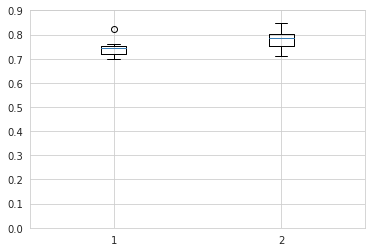

In [452]:
tmp = (df_tmp['refined b']/df_tmp['noisy b'])
v1 = tmp['A6 B31 A8 A5 sc23 B26 B19 B16 sc16 B3'.split()]
v2 = tmp['A2 A3 sc1 B6 A9 sc24 sc29 sc19 sc21 B15'.split()]
plt.boxplot([v1, v2])
plt.ylim([0,0.9])
scipy.stats.mannwhitneyu(v1,v2)

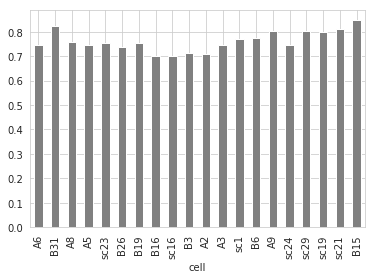

In [453]:
(df_tmp['refined b']/df_tmp['noisy b'])[order].plot(kind='bar', color='gray')

### Types of boundaries

In [481]:
# # Allowing offset = 1
# tmp = refined_boundaries.copy()
# mtx = tmp.values # Extracting dataframe as matrix for fast numpy computation
# for i_col in range(len(tmp.columns)):
#     v = np.where(tmp.iloc[:, i_col] == 1)[0][1:-1]
#     mtx[np.concatenate([v-1, v+1]), i_col] = 1
# tmp.loc[:,:] = mtx

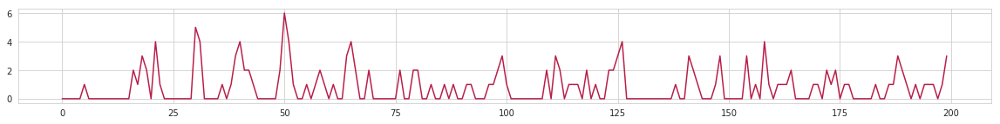

In [509]:
# v = refined_boundaries.sum(axis=1).loc(axis=0)['chrX', :].values
# plt.figure(figsize=[20,2])
# plt.plot(v[500:700])

In [198]:
v = bs_support

In [199]:
#v = df.loc[:, labels_ordered[2:]].sum(axis=1)
idx_more11 = (v[v>=11]).index.copy()
idx_more8 = (v[(v>=8)&(v<11)]).index.copy()
idx_less8 = (v[(v<8)&(v>1)]).index.copy()
idx_1 = (v[v==1]).index.copy()
idx_never = (v[v<1]).index.copy()

In [200]:
toplot = {
    'more11' : idx_more11,
    'more8' : idx_more8,
    'less8' : idx_less8,
    '1'      : idx_1,
    'never'  : idx_never
}

In [201]:
df_tmp = pd.DataFrame([(k, len(toplot[k])) for k in toplot.keys()]+[['total_bins', len(df)]],
            columns=['type', '#'])

df_tmp.loc[:,'prc'] = 100*df_tmp.loc[:,'#']/df_tmp.loc[5,"#"]

In [202]:
df_tmp

,type,#,prc
0,more11,664,5.580770
1,more8,1858,15.616070
2,less8,6044,50.798454
3,1,317,2.664313
4,never,3015,25.340393
5,total_bins,11898,100.000000


### Epigenetics analysis

In [203]:
toplot_filtered = toplot

In [204]:
import bbi
import matplotlib.gridspec as gridspec

In [205]:
#df_epi = pd.read_csv("../DATA_SUBSAMPLE/full_boundary_annotation_table.csv")

In [206]:
#selected_tracks = ['268', '39', '48', '21', '171']

In [207]:
#[(annot1[x], x) for x in selected_tracks]

DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf

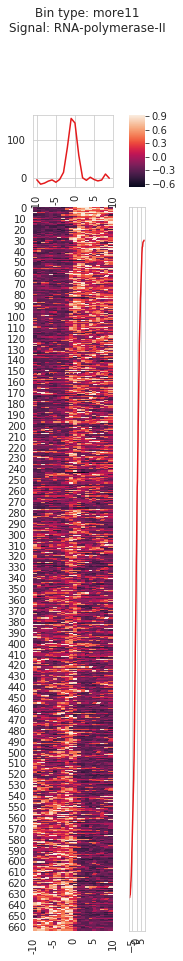

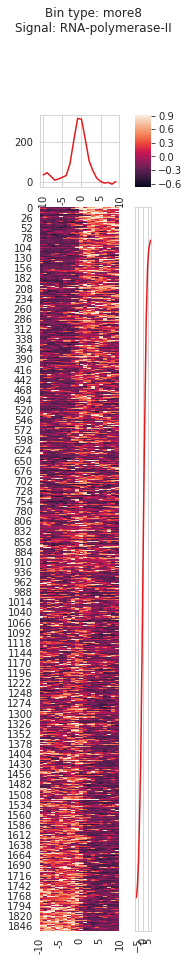

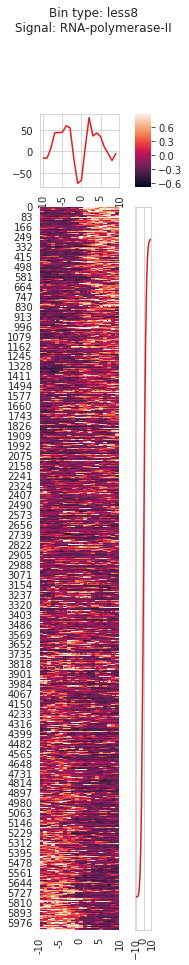

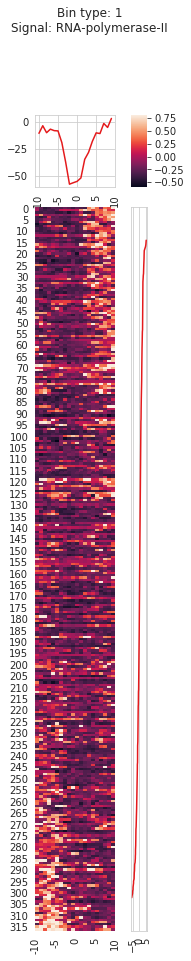

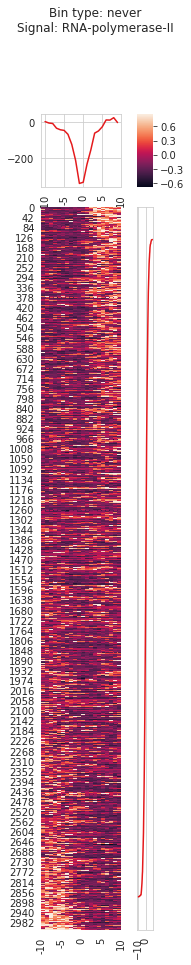

...

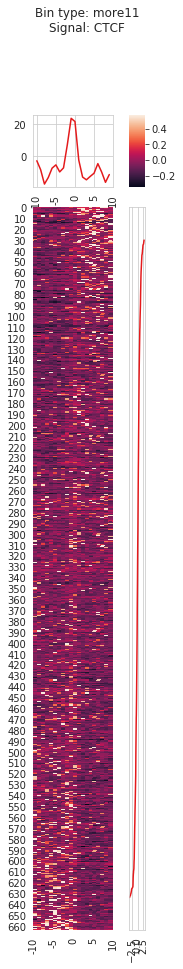

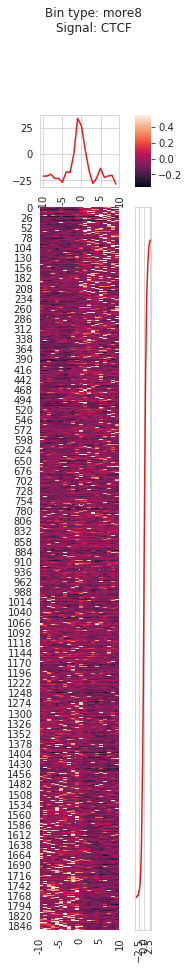

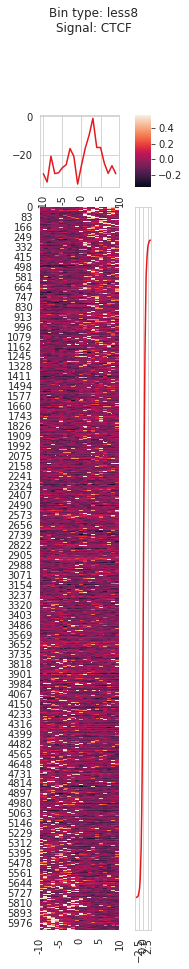

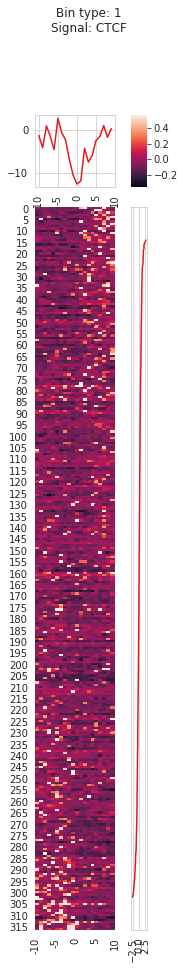

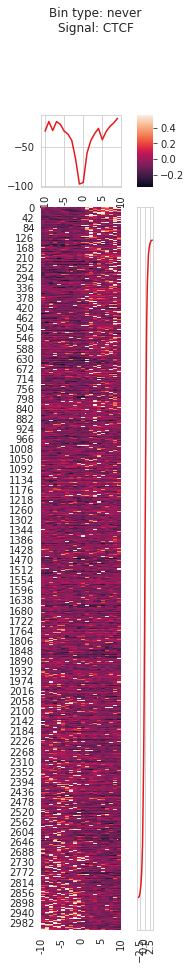

In [209]:
for k in ['268', '39', '48', '21', '171']:
    
    path = '../DATA/ANNOT/tmp/{}.bw'.format(k)
    name = annot1[k]

    window = 100000 # window size (one-sided)
    nbins = 20 # number of bins in the window

    for cat, idx in toplot_filtered.items():

        # df_tmp is the dataframe of anchors with columns ch=chromosomes, pos=positions of anchors
        df_tmp = df.loc[idx,[]].reset_index()
        df_tmp.columns = ['ch', 'pos']

        chroms = df_tmp.ch
        starts = df_tmp.pos-window
        ends   = df_tmp.pos+window

        # Creation of numpy 2D array with annotation snippets
        s = bbi.stackup(path, chroms, starts, ends, bins=nbins) 
        s[np.isnan(s)] = 0

        # Ordering
        for_order = (s[:,10:].sum(axis=1)-s[:,:11].sum(axis=1)) #s[:,8:13].sum(axis=1) # ordering by central values of stack
        order = np.argsort(for_order)[::-1]

        # Plotting and tuning the plot
        fig = plt.figure(figsize=[2,15])
        gs = gridspec.GridSpec(2, 3,
                               width_ratios=[5, 1, 1],
                               height_ratios=[1, 10], 
                               wspace=0.0, hspace=0.05)

        ax_col_marg = plt.subplot(gs[0]) # upper profile
        ax_row_marg = plt.subplot(gs[5]) # right marginal distribution of rows or custom numbers
        ax_bar = plt.subplot(gs[2]) # colorbar
        ax_heatmap = plt.subplot(gs[3]) # heatmap

        sns.heatmap(s[order,:], ax=ax_heatmap, cbar_ax=ax_bar, vmax=np.percentile(a=s.flatten(), q=98))
        ax_heatmap.set_xticks(np.arange(0, nbins+1, 5))
        ax_heatmap.set_xticklabels(np.arange(-nbins/2, 1+nbins/2, 5).astype(int), rotation=90)
        ax_col_marg.set_xticks(np.arange(0, nbins+1, 5))
        ax_col_marg.set_xticklabels(np.arange(-nbins/2, 1+nbins/2, 5).astype(int), rotation=90)

        ax_row_marg.set_yticks([])
        ax_row_marg.tick_params(labelrotation=90)

        ax_col_marg.plot(s[order,:].sum(axis=0))
        ax_row_marg.plot(for_order[order[::-1]], np.arange(s.shape[0]))

        fig.suptitle("Bin type: {}\nSignal: {}".format(cat, name), x=0.5, y=0.98)
        
        fig.savefig("../IMG/EPI/3_stackup_assymetry_{}_{}.pdf".format(cat, name))

In [212]:
l = """beaf32_manke_dm3_1.0e-04.bed
ctcf_manke_dm3_1.0e-04.bed
gaatagaaa_manke_dm3_1.0e-04.bed
gaf_manke_dm3_1.0e-04.bed
ibf_manke_dm3_1.0e-04.bed
ohler1_manke_dm3_1.0e-04.bed
ohler5_manke_dm3_1.0e-04.bed
ohler6_manke_dm3_1.0e-04.bed
ohler8dreme_manke_dm3_1.0e-04.bed
ohler8_manke_dm3_1.0e-04.bed
pita_manke_dm3_1.0e-04.bed
suhw_manke_dm3_1.0e-04.bed
suhwsh_manke_dm3_1.0e-04.bed
zipic_manke_dm3_1.0e-04.bed
zw5_manke_dm3_1.0e-04.bed""".split()

DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf'
DEBUG:matplotlib.backends.backend_pdf:Embedding font /home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf.
DEBUG:matplotlib.backends.backend_pdf:Writing TrueType font.
DEBUG:matplotlib.backends.backend_pdf:Assigning font /b'F1' = '/home/agalicina/anaconda3/envs/sci-python3/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf

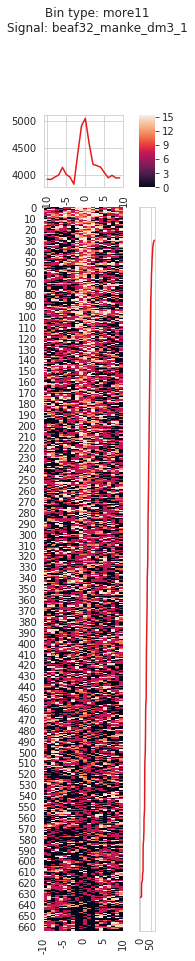

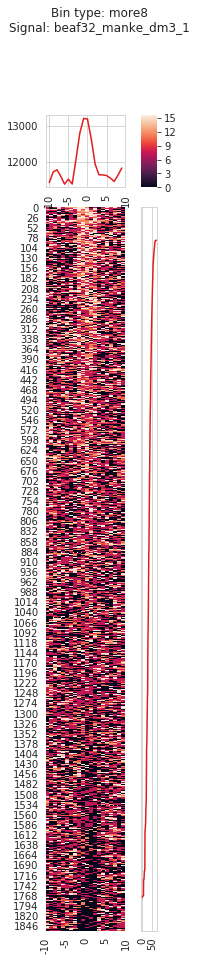

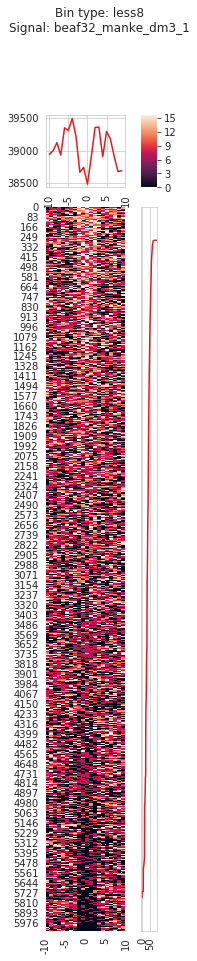

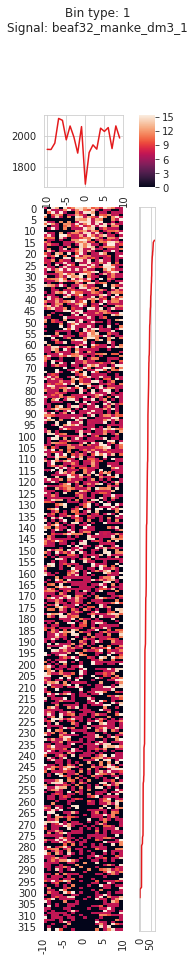

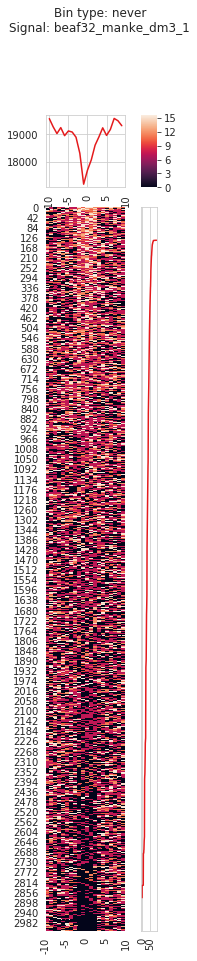

...

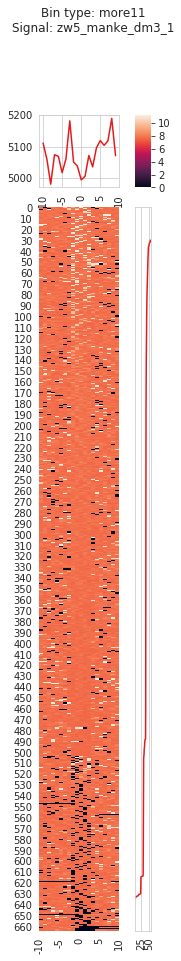

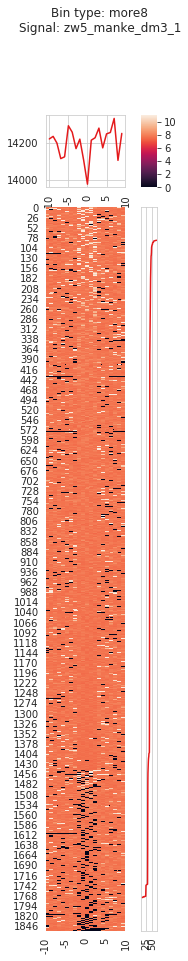

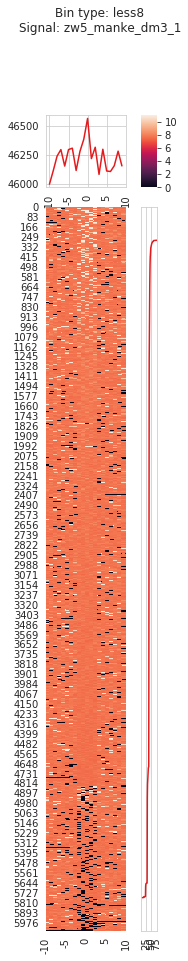

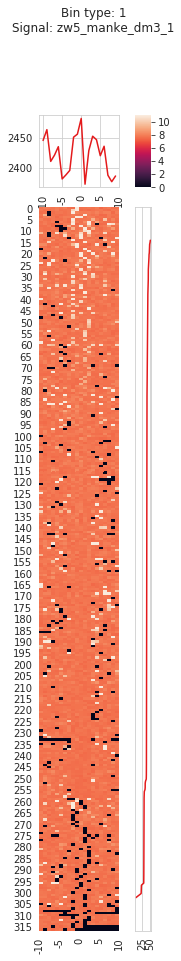

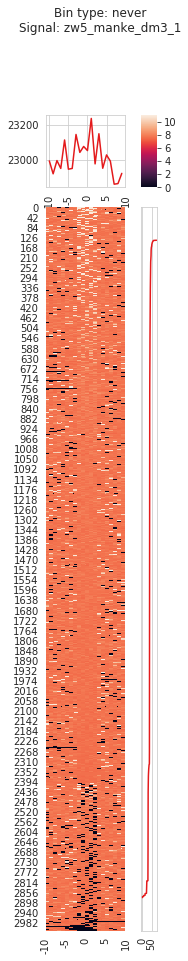

In [215]:
for f in l:
    
    path = '../DATA/ANNOT/NewMotifs/{}.bw'.format(f)
    name = f.split('.')[0]

    window = 100000 # window size (one-sided)
    nbins = 20 # number of bins in the window

    for cat, idx in toplot_filtered.items():

        # df_tmp is the dataframe of anchors with columns ch=chromosomes, pos=positions of anchors
        df_tmp = df.loc[idx,[]].reset_index()
        df_tmp.columns = ['ch', 'pos']

        chroms = df_tmp.ch
        starts = df_tmp.pos-window
        ends   = df_tmp.pos+window

        # Creation of numpy 2D array with annotation snippets
        s = bbi.stackup(path, chroms, starts, ends, bins=nbins) 
        s[np.isnan(s)] = 0
        #s = s>0

        # Ordering # (s[:,10:].sum(axis=1)-s[:,:11].sum(axis=1)) #
        for_order = s[:,8:13].sum(axis=1) # ordering by central values of stack
        order = np.argsort(for_order)[::-1]

        # Plotting and tuning the plot
        fig = plt.figure(figsize=[2,15])
        gs = gridspec.GridSpec(2, 3,
                               width_ratios=[5, 1, 1],
                               height_ratios=[1, 10], 
                               wspace=0.0, hspace=0.05)

        ax_col_marg = plt.subplot(gs[0]) # upper profile
        ax_row_marg = plt.subplot(gs[5]) # right marginal distribution of rows or custom numbers
        ax_bar = plt.subplot(gs[2]) # colorbar
        ax_heatmap = plt.subplot(gs[3]) # heatmap

        sns.heatmap(s[order,:], ax=ax_heatmap, cbar_ax=ax_bar, vmax=np.percentile(a=s.flatten(), q=98))
        ax_heatmap.set_xticks(np.arange(0, nbins+1, 5))
        ax_heatmap.set_xticklabels(np.arange(-nbins/2, 1+nbins/2, 5).astype(int), rotation=90)
        ax_col_marg.set_xticks(np.arange(0, nbins+1, 5))
        ax_col_marg.set_xticklabels(np.arange(-nbins/2, 1+nbins/2, 5).astype(int), rotation=90)

        ax_row_marg.set_yticks([])
        ax_row_marg.tick_params(labelrotation=90)

        ax_col_marg.plot(s[order,:].sum(axis=0))
        ax_row_marg.plot(for_order[order[::-1]], np.arange(s.shape[0]))

        fig.suptitle("Bin type: {}\nSignal: {}".format(cat, name), x=0.5, y=0.98)
        
        fig.savefig("../IMG/EPI/3_stackup_assymetry_{}_new_{}.pdf".format(cat, name))

In [ ]:
# Epigenetic sorted by boundary occurence

for k in ['268', '39', '48', '21', '171', '253']:
    
    path = '../DATA/ANNOT/tmp/{}.bw'.format(k)
    name = annot1[k]

    window = 100000 # window size (one-sided)
    nbins = 20 # number of bins in the window

            
    # df_tmp is the dataframe of anchors with columns ch=chromosomes, pos=positions of anchors
    df_tmp = df_final.reset_index()[['ch', 'bgn']] # .loc[idx,[]]
    df_tmp.columns = ['ch', 'pos']

    chroms = df_tmp.ch
    starts = df_tmp.pos-window
    ends = df_tmp.pos+window

    # Creation of numpy 2D array with annotation snippets
    s = bbi.stackup(path, chroms, starts, ends, bins=nbins) 
    s[np.isnan(s)] = 0

    # Ordering
    for_order = presence_bycell.sum(axis=1) #s[:,8:13].sum(axis=1) # ordering by central values of stack
    order = np.argsort(for_order)[::-1]

    # Plotting and tuning the plot
    fig = plt.figure(figsize=[2,15])
    gs = gridspec.GridSpec(2, 3,
                           width_ratios=[5, 1, 1],
                           height_ratios=[1, 10], 
                           wspace=0.0, hspace=0.05)

    ax_col_marg = plt.subplot(gs[0]) # upper profile
    ax_row_marg = plt.subplot(gs[5]) # right marginal distribution of rows or custom numbers
    ax_bar = plt.subplot(gs[2]) # colorbar
    ax_heatmap = plt.subplot(gs[3]) # heatmap

    sns.heatmap(s[order,:], ax=ax_heatmap, cbar_ax=ax_bar, vmax=np.percentile(a=s.flatten(), q=98))
    ax_heatmap.set_xticks(np.arange(0, nbins+1, 5))
    ax_heatmap.set_xticklabels(np.arange(-nbins/2, 1+nbins/2, 5).astype(int), rotation=90)
    ax_col_marg.set_xticks(np.arange(0, nbins+1, 5))
    ax_col_marg.set_xticklabels(np.arange(-nbins/2, 1+nbins/2, 5).astype(int), rotation=90)

    ax_row_marg.set_yticks([])
    ax_row_marg.tick_params(labelrotation=90)

    ax_col_marg.plot(s[order,:].sum(axis=0))
    ax_row_marg.plot(for_order[order[::-1]], np.arange(s.shape[0]))

    fig.suptitle("Signal: {}".format(name), x=0.5, y=0.98)

    fig.savefig("../IMG/EPI/4_stackup_all_{}.pdf".format(name))
    #fig.savefig("../IMG/EPI/4_stackup_all_{}.png".format(name))

## ?
#### Out of all bins:

In [828]:
df_perc = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( mtx * golden_standard ).sum(axis=0)/len(golden_standard)
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc)==0:
        df_perc = df_tmp.copy()
    else:
        df_perc = pd.merge(df_perc, df_tmp, left_index=True, right_index=True)

In [829]:
df_perc_over = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( mtx * np.logical_not(golden_standard) ).sum(axis=0)/len(golden_standard)
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc_over)==0:
        df_perc_over = df_tmp.copy()
    else:
        df_perc_over = pd.merge(df_perc_over, df_tmp, left_index=True, right_index=True)

In [830]:
df_perc_under = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( np.logical_not(mtx) * golden_standard ).sum(axis=0)/len(golden_standard)
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc_under)==0:
        df_perc_under = df_tmp.copy()
    else:
        df_perc_under = pd.merge(df_perc_under, df_tmp, left_index=True, right_index=True)

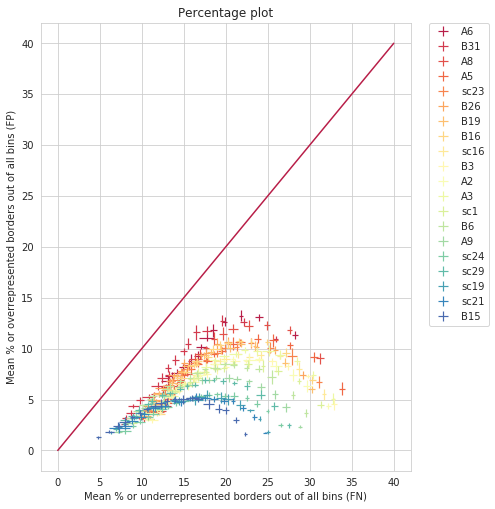

In [831]:
sns.set_palette('Spectral', 20) #husl
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp]
    stderr_x = df_perc_under.groupby('perc').std()[exp]
    means_y  = df_perc_over.groupby('perc').mean()[exp]
    stderr_y = df_perc_over.groupby('perc').std()[exp]
    plt.errorbar(100*means_x, 100*means_y, label=exp,
                 xerr=100*stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, caps2ize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Mean % or underrepresented borders out of all bins (FN)')
plt.ylabel('Mean % or overrepresented borders out of all bins (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

plt.plot([0,40], [0,40])

Text(0.5,1,'Percentage plot')

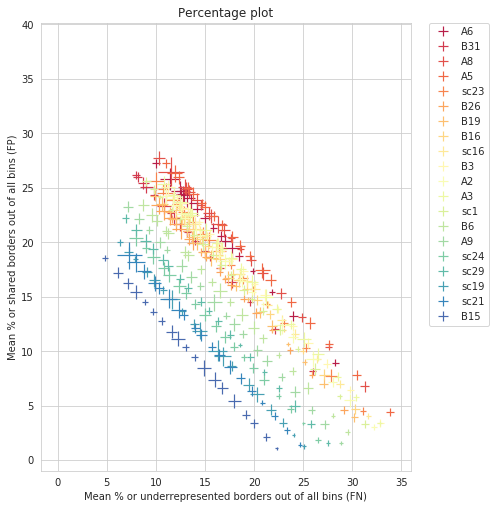

In [792]:
sns.set_palette('Spectral', 20) #husl
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp]
    stderr_x = df_perc_under.groupby('perc').std()[exp]
    means_y  = df_perc.groupby('perc').mean()[exp]
    stderr_y = df_perc.groupby('perc').std()[exp]
    plt.errorbar(100*means_x, 100*means_y, label=exp,
                 xerr=100*stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Mean % or underrepresented borders out of all bins (FN)')
plt.ylabel('Mean % or shared borders out of all bins (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

Text(0.5,1,'Percentage plot')

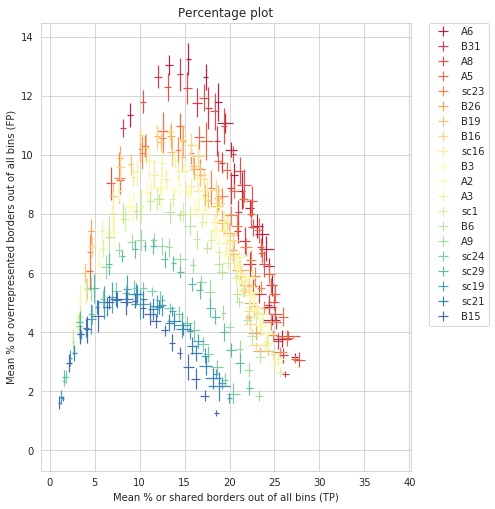

In [793]:
sns.set_palette('Spectral', 20) #husl
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc.groupby('perc').mean()[exp]
    stderr_x = df_perc.groupby('perc').std()[exp]
    means_y  = df_perc_over.groupby('perc').mean()[exp]
    stderr_y = df_perc_over.groupby('perc').std()[exp]
    plt.errorbar(100*means_x, 100*means_y, label=exp,
                 xerr=100*stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Mean % or shared borders out of all bins (TP)')
plt.ylabel('Mean % or overrepresented borders out of all bins (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

### Compute nice plots
Out of groups of bins: 

In [64]:
tmp = df_perc_under.groupby('perc').mean()
tmp = tmp.set_index(tmp.index.astype(int)).sort_index(ascending=False)<=0.75

thresholds = pd.DataFrame(tmp.index[tmp.apply(lambda x: np.where(x==True)[0][-1], axis=0)], index=tmp.columns)
selected_prc = np.arange(thresholds.loc[exp].values[0], 105, 5)

In [240]:
exp = 'B15'
df_exp = df.loc(axis=1)[:, exp, :, ['100', '90', '95', '80', '85']].T
golden_standard = df_exp.loc[exp,:].values[0]

tmp = df_exp.loc[:,golden_standard]
v = tmp.sum(axis=0)/len(tmp)

tmp = df_exp.loc[:,np.logical_not(golden_standard)]
v1 = tmp.sum(axis=0)/len(tmp)


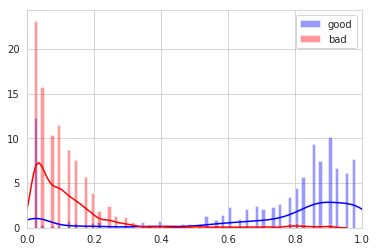

In [241]:
sns.distplot(v[v>0], bins=np.arange(0,1,0.01), label='good', color='blue')
sns.distplot(v1[v1>0], bins=np.arange(0,1,0.01), label='bad', color='red')
plt.xlim(0,1)
plt.legend()

In [242]:
th = 0.4
tmp = df.loc(axis=1)[:, :, :, ['90', '95', '80', '85']].T
good_bins = (tmp.sum(axis=0)/len(tmp)>th)
good_bins = good_bins[good_bins.values].index

In [243]:
df_final = df.loc[good_bins,experiment_ids]

In [166]:
exp = 'A6'
th = 80 #thresholds.loc[exp].values[0]
tmp = df.loc(axis=1)[:, exp, :, :].T
golden_standard = tmp.loc[exp,:].values
tmp = tmp.reset_index()
tmp.loc[:, 'perc'] = tmp.perc.astype(int)
tmp = tmp.set_index('colname')
v = tmp.loc[tmp.perc>th, golden_standard[0]].mean(axis=0)
v1 = tmp.loc[tmp.perc>th, np.logical_not(golden_standard[0])].mean(axis=0)

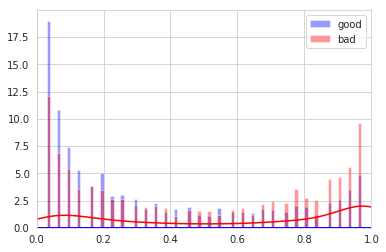

In [6]:
df_perc = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    selected_prc = np.arange(thresholds.loc[exp].values[0], 105, 5)
    
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( mtx * golden_standard ).sum(axis=0)/golden_standard.sum()
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc)==0:
        df_perc = df_tmp.copy()
    else:
        df_perc = pd.merge(df_perc, df_tmp, left_index=True, right_index=True)

NameError: name 'thresholds' is not defined

In [ ]:
thresholds

In [7]:
df_perc = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( mtx * golden_standard ).sum(axis=0)/golden_standard.sum()
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc)==0:
        df_perc = df_tmp.copy()
    else:
        df_perc = pd.merge(df_perc, df_tmp, left_index=True, right_index=True)

In [21]:
df_perc_over = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( mtx * np.logical_not(golden_standard) ).sum(axis=0)/np.logical_not(golden_standard).sum()
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc_over)==0:
        df_perc_over = df_tmp.copy()
    else:
        df_perc_over = pd.merge(df_perc_over, df_tmp, left_index=True, right_index=True)

In [47]:
df_perc_under = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( np.logical_not(mtx) * golden_standard ).sum(axis=0)/golden_standard.sum()
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc_under)==0:
        df_perc_under = df_tmp.copy()
    else:
        df_perc_under = pd.merge(df_perc_under, df_tmp, left_index=True, right_index=True)

In [ ]:
# abs count

In [74]:
pd.DataFrame([(exp,df.loc[:,exp].values.sum(), len(df.loc[:,exp].values)) for exp in labels_ordered[2:]], columns=['cell', 'nbins', 'total_bins'])

,cell,nbins,total_bins
0,A6,4427,11898
1,B31,4061,11898
2,A8,4524,11898
3,A5,4553,11898
4,sc23,4236,11898
5,B26,4015,11898
6,B19,4062,11898
7,B16,4164,11898
8,sc16,4250,11898
9,B3,4316,11898


In [ ]:
len(df)

In [60]:
df_perc_over = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( mtx * np.logical_not(golden_standard) ).sum(axis=0)#/np.logical_not(golden_standard).sum()
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc_over)==0:
        df_perc_over = df_tmp.copy()
    else:
        df_perc_over = pd.merge(df_perc_over, df_tmp, left_index=True, right_index=True)

Text(0.5,1,'Percentage plot')

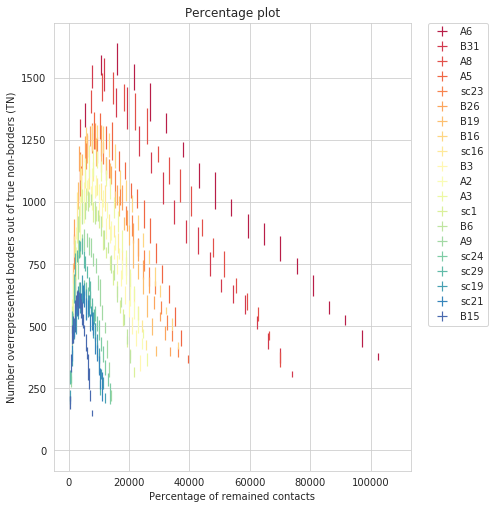

In [61]:
sns.set_palette('Spectral', 20)
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_over.groupby('perc').mean()[exp].reset_index()['perc'].astype(int)\
        *contacts_counts.loc[exp,'ncontacts']/100
    stderr_x = np.ones(len(means_x))
    means_y  = df_perc_over.groupby('perc').mean()[exp]
    stderr_y = df_perc_over.groupby('perc').std()[exp]
    plt.errorbar(means_x, means_y, label=exp,
                 xerr=stderr_x, 
                 yerr=stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Percentage of remained contacts')
plt.ylabel('Number overrepresented borders out of true non-borders (TN)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

#plt.savefig('../IMG/SUBSAMPLE/overrepr.pdf')

In [58]:
df_perc_under = pd.DataFrame()
for exp in labels_ordered[2:]:
    
    golden_standard = df.loc[:,exp].values
    mtx = df.loc(axis=1)[:, exp, :, :].values
    colnames = df.loc(axis=1)[:, exp, :, :].columns
    
    v = ( np.logical_not(mtx) * golden_standard ).sum(axis=0)#/golden_standard.sum()
    
    df_tmp = pd.DataFrame(v, index=colnames, columns=[exp])\
        .reset_index().drop(['colname', 'cell'], axis=1)\
        .set_index(['niter', 'perc'])
    if len(df_perc_under)==0:
        df_perc_under = df_tmp.copy()
    else:
        df_perc_under = pd.merge(df_perc_under, df_tmp, left_index=True, right_index=True)

Text(0.5,1,'Percentage plot')

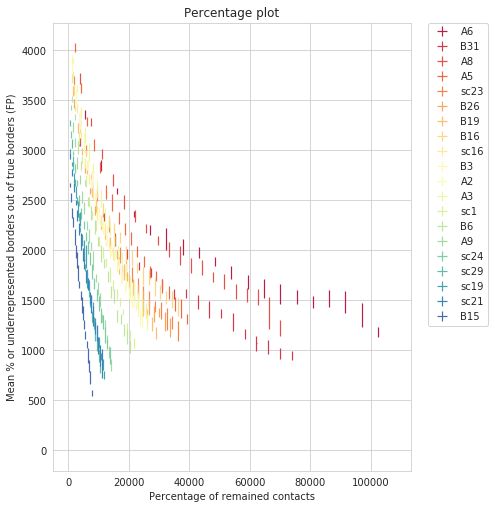

In [59]:
sns.set_palette('Spectral', 20)
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp].reset_index()['perc'].astype(int)\
        *contacts_counts.loc[exp,'ncontacts']/100
    stderr_x = np.ones(len(means_x))
    means_y  = df_perc_under.groupby('perc').mean()[exp]
    stderr_y = df_perc_under.groupby('perc').std()[exp]
    plt.errorbar(means_x, means_y, label=exp,
                 xerr=stderr_x, 
                 yerr=stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Percentage of remained contacts')
plt.ylabel('Number of underrepresented borders out of true borders (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

#plt.savefig('../IMG/SUBSAMPLE/underrepr.pdf')

In [10]:
contacts_counts = pd.DataFrame(index=experiment_ids)
for exp in experiment_ids:
    f = "../DATA/COOL/{}.10.cool".format(exp)
    ncontacts = cooler.Cooler(f).pixels()[:]['count'].sum()
    contacts_counts.loc[exp,'ncontacts'] = ncontacts

Text(0.5,1,'Percentage plot')

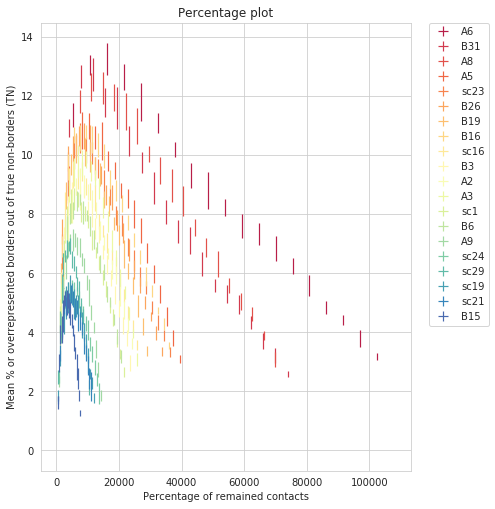

In [25]:
sns.set_palette('Spectral', 20)
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_over.groupby('perc').mean()[exp].reset_index()['perc'].astype(int)\
        *contacts_counts.loc[exp,'ncontacts']/100
    stderr_x = np.ones(len(means_x))
    means_y  = df_perc_over.groupby('perc').mean()[exp]
    stderr_y = df_perc_over.groupby('perc').std()[exp]
    plt.errorbar(means_x, 100*means_y, label=exp,
                 xerr=stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Percentage of remained contacts')
plt.ylabel('Mean % or overrepresented borders out of true non-borders (TN)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

#plt.savefig('../IMG/SUBSAMPLE/overrepr.pdf')

Text(0.5,1,'Percentage plot')

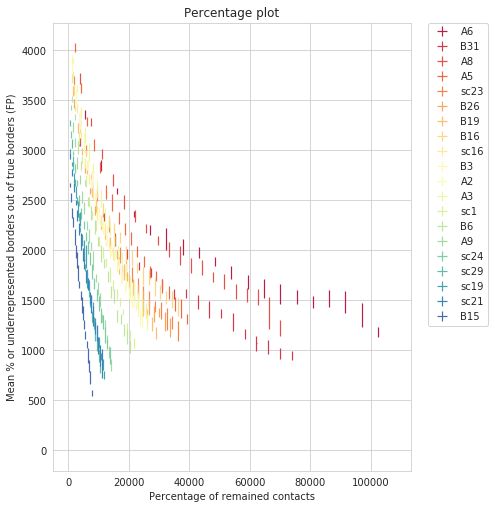

In [53]:
sns.set_palette('Spectral', 20)
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp].reset_index()['perc'].astype(int)\
        *contacts_counts.loc[exp,'ncontacts']/100
    stderr_x = np.ones(len(means_x))
    means_y  = df_perc_under.groupby('perc').mean()[exp]
    stderr_y = df_perc_under.groupby('perc').std()[exp]
    plt.errorbar(means_x, 100*means_y, label=exp,
                 xerr=stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Percentage of remained contacts')
plt.ylabel('Mean % or underrepresented borders out of true borders (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

plt.savefig('../IMG/SUBSAMPLE/underrepr.pdf')

Text(0.5,1,'Percentage plot')

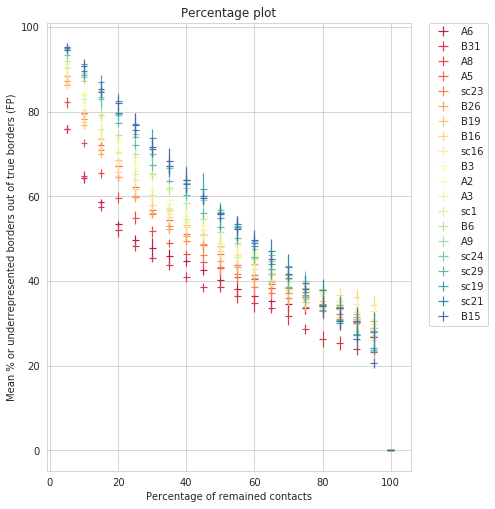

In [51]:
sns.set_palette('Spectral', 20)
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp].reset_index()['perc'].astype(int)
    stderr_x = np.ones(len(means_x))
    means_y  = df_perc_under.groupby('perc').mean()[exp]
    stderr_y = df_perc_under.groupby('perc').std()[exp]
    plt.errorbar(means_x, 100*means_y, label=exp,
                 xerr=stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Percentage of remained contacts')
plt.ylabel('Mean % or underrepresented borders out of true borders (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

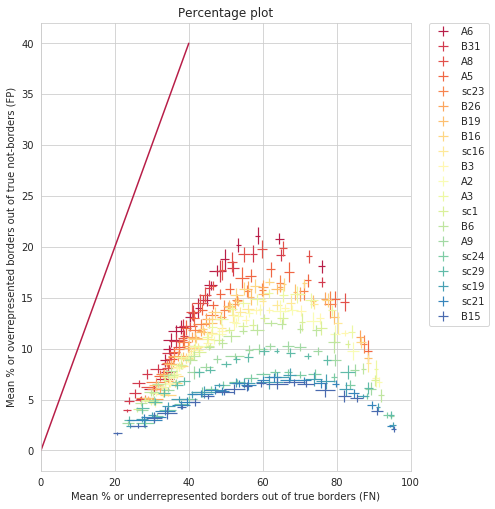

In [827]:
sns.set_palette('Spectral', 20) #husl
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp]
    stderr_x = df_perc_under.groupby('perc').std()[exp]
    means_y  = df_perc_over.groupby('perc').mean()[exp]
    stderr_y = df_perc_over.groupby('perc').std()[exp]
    plt.errorbar(100*means_x, 100*means_y, label=exp,
                 xerr=100*stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Mean % or underrepresented borders out of true borders (FN)')
plt.ylabel('Mean % or overrepresented borders out of true not-borders (FP)')
plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])
plt.plot([0,40], [0,40])

Text(0.5,1,'Percentage plot')

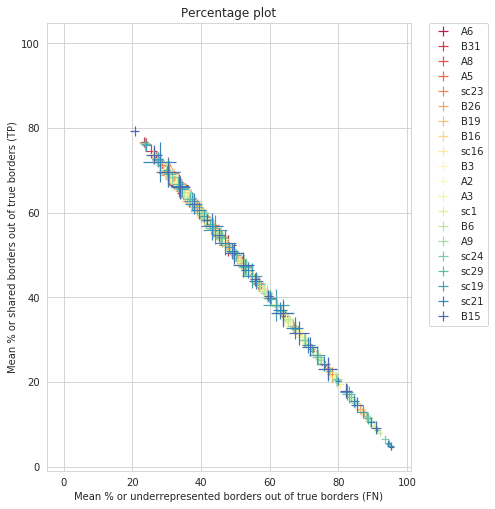

In [786]:
sns.set_palette('Spectral', 20) #husl
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc_under.groupby('perc').mean()[exp]
    stderr_x = df_perc_under.groupby('perc').std()[exp]
    means_y  = df_perc.groupby('perc').mean()[exp]
    stderr_y = df_perc.groupby('perc').std()[exp]
    plt.errorbar(100*means_x, 100*means_y, label=exp,
                 xerr=100*stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Mean % or underrepresented borders out of true borders (FN)')
plt.ylabel('Mean % or shared borders out of true borders (TP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

Text(0.5,1,'Percentage plot')

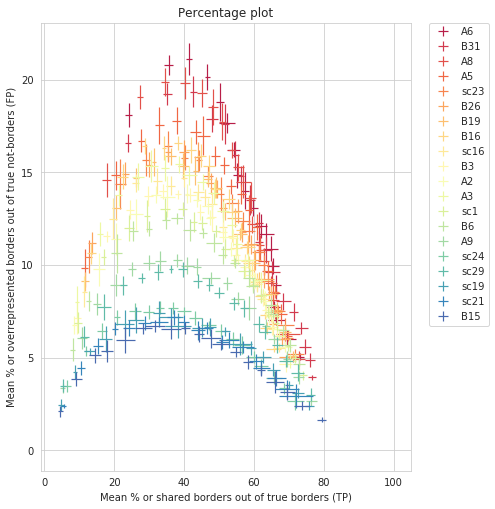

In [787]:
sns.set_palette('Spectral', 20) #husl
plt.figure(figsize=[7,7])
for exp in labels_ordered[2:]:
    means_x  = df_perc.groupby('perc').mean()[exp]
    stderr_x = df_perc.groupby('perc').std()[exp]
    means_y  = df_perc_over.groupby('perc').mean()[exp]
    stderr_y = df_perc_over.groupby('perc').std()[exp]
    plt.errorbar(100*means_x, 100*means_y, label=exp,
                 xerr=100*stderr_x, 
                 yerr=100*stderr_y, 
                elinewidth=1.2, capsize=0, capthick=1.5, linewidth=0)

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
plt.xlabel('Mean % or shared borders out of true borders (TP)')
plt.ylabel('Mean % or overrepresented borders out of true not-borders (FP)')
#plt.xlim([0,100])
plt.tight_layout()
plt.title('Percentage plot')
#plt.ylim([0,1])

/home/agalicina/anaconda3/envs/distiller-editable/lib/python3.6/site-packages/pandas/core/generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)
